In [7]:
import torch
import cv2 as cv
import pandas as pd
import easyocr
from PIL import Image

In [8]:
model = torch.hub.load('.', 'custom', path = 'best.pt', source = 'local', force_reload = True)
reader = easyocr.Reader(['ch_sim','en'])

YOLOv5  v6.2-94-g1aea74c Python-3.9.13 torch-1.12.1+cpu CPU

Fusing layers... 
Model summary: 213 layers, 7015519 parameters, 0 gradients, 15.8 GFLOPs
Adding AutoShape... 
CUDA not available - defaulting to CPU. Note: This module is much faster with a GPU.
C:\Users\mkjay\Desktop\hackathon\lib\site-packages\torchvision\models\_utils.py:252: UserWarning: Accessing the model URLs via the internal dictionary of the module is deprecated since 0.13 and will be removed in 0.15. Please access them via the appropriate Weights Enum instead.
  warnings.warn(
C:\Users\mkjay\Desktop\hackathon\lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and will be removed in 0.15, please use 'weights' instead.
  warnings.warn(
C:\Users\mkjay\Desktop\hackathon\lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and will be removed in 0.15. The curr

In [41]:
def imgProcess(test_image):
    font = cv.FONT_HERSHEY_TRIPLEX
    test_image_rgb = cv.cvtColor(test_image, cv.COLOR_BGR2RGB)

    results = model(test_image_rgb)
    annotations = results.pandas().xyxy
    annotations = annotations[0][['xmin', 'ymin', 'xmax', 'ymax']]
    #print(annotations.loc[i])

    #print(annotations)
    for i in range(len(annotations)):
        boxes = annotations.loc[i]
        x = int(boxes['xmin'])
        x1 = int(boxes['xmax'])
        y = int(boxes['ymin'])
        y1 = int(boxes['ymax'])

        crop_image = test_image[y:y1, x:x1]
    #crop_image = Image.fromarray(crop_image, "RGB")
    #text = pytesseract.image_to_string(crop_image)
        text = reader.readtext(crop_image, detail = 0)
        plate = ' '.join(text)

        cv.rectangle(test_image_rgb, (x, y), (x1, y1), (175, 0, 0), 2)
        cv.putText(test_image_rgb, plate, (x+5, y-5), font, 3, (255, 255, 255), 4)
    
    return test_image_rgb, plate

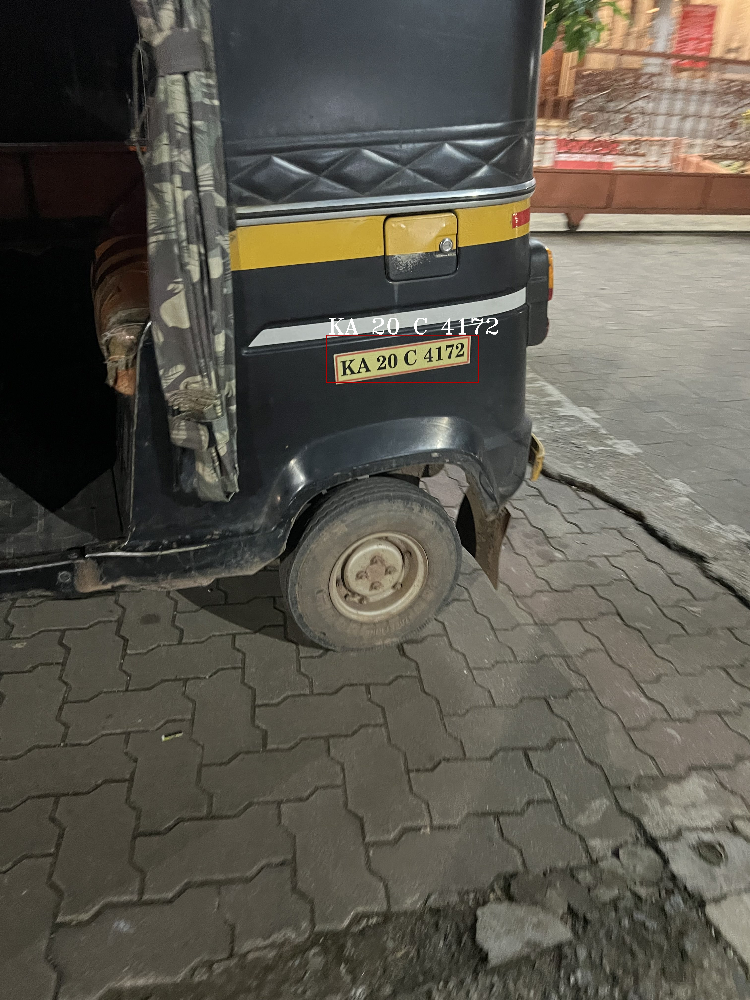

     REG._PLATE           NAME LICENSE_STATUS RC_STATUS INSURANCE_STATUS
1  KA 20 C 4172  Tarun Sadarla             Ok        Ok   Up for renewal


In [45]:
df = pd.read_csv("drivers_database.csv")
df.set_index("REG._PLATE")
car = cv.imread("test_image.jpg")
image, plate = imgProcess(car)

#if vehicle broke any traffic law

res = Image.fromarray(image, "RGB")
display(res)
print(df[df['REG._PLATE'] == plate])

In [ ]:
video = cv.VideoCapture('test_video_2.mp4')
while video.isOpened():
    ret, frame = video.read()
    image, plate = imgProcess(frame)
    cv.imshow("detect",image)
    if cv.waitKey(1) == ord('q'):
        break